# Setup

In [1]:
import scanpy as sc
import scrnatools as rna
import scvi
import os
import shutil
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import plotly.graph_objects as go
from ipywidgets import *
import warnings
import scrublet as scr

Global seed set to 0
/opt/conda/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/opt/conda/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
sc.set_figure_params(figsize=(6,6),  dpi=80, dpi_save=300, facecolor="white", frameon=False)
plt.rcParams["axes.grid"] = False
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
os.getcwd()

'/notebook/Joe/mTEC-eTAC-atlases/code'

# Import raw data

## Gardner lab data

In [4]:
wtGFP_1 = sc.read_10x_h5("/notebook/External/Archive/Joe/raw_data/Jessica_eTACs/sample_1_WT_GFP/RNA_GFP_filtered_feature_bc_matrix.h5")
wtGFP_1.var_names_make_unique()
wtGFP_1.obs.index = wtGFP_1.obs.index + "-Gardner_wtGFP_1"
wtGFP_1.obs["experiment_number"] = "1"
wtGFP_1.obs["sort"] = "GFP"
wtGFP_1.obs["Annotation"] = "N/A"
wtGFP_1.obs["source"] = "Gardner"

wtREF_1 = sc.read_10x_h5("/notebook/External/Archive/Joe/raw_data/Jessica_eTACs/sample_1_WT_GFP/RNA_WT_filtered_feature_bc_matrix.h5")
wtREF_1.var_names_make_unique()
wtREF_1.obs.index = wtREF_1.obs.index + "-Gardner_wtREF_1"
wtREF_1.obs["experiment_number"] = "1"
wtREF_1.obs["sort"] = "REF"
wtREF_1.obs["Annotation"] = "N/A"
wtREF_1.obs["source"] = "Gardner"

wtGFP_2 = sc.read_10x_h5("/notebook/External/Archive/Joe/raw_data/Jessica_eTACs/sample_2_WT_KO_GFP/WT_Pos_fiveprime_rna_filtered_feature_bc_matrix.h5")
wtGFP_2.var_names_make_unique()
wtGFP_2.obs.index = wtGFP_2.obs.index + "-Gardner_wtGFP_2"
wtGFP_2.obs["experiment_number"] = "2"
wtGFP_2.obs["sort"] = "GFP"
wtGFP_2.obs["Annotation"] = "N/A"
wtGFP_2.obs["source"] = "Gardner"

wtREF_2 = sc.read_10x_h5("/notebook/External/Archive/Joe/raw_data/Jessica_eTACs/sample_2_WT_KO_GFP/WT_Ref_fiveprime_rna_filtered_feature_bc_matrix.h5")
wtREF_2.var_names_make_unique()
wtREF_2.obs.index = wtREF_2.obs.index + "-Gardner_wtREF_2"
wtREF_2.obs["experiment_number"] = "2"
wtREF_2.obs["sort"] = "REF"
wtREF_2.obs["Annotation"] = "N/A"
wtREF_2.obs["source"] = "Gardner"

/opt/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


## Brown 2022

In [5]:
rudensky = pd.read_csv("/notebook/External/Archive/Joe/raw_data/Published_LN/Brown_2022/RNA/GSE205066_RAW/GSM6204751_rna_raw-counts.tsv", delimiter="\t")

In [6]:
rudenskyAdata = sc.AnnData(pd.DataFrame(rudensky[rudensky.columns[~rudensky.columns.isin(["gene.ID", "gene.symbol"])]]).T)
rudenskyAdata.var_names = rudensky["gene.symbol"]
rudenskyAdata.var_names_make_unique()

/opt/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [7]:
metadata = pd.read_csv("/notebook/External/Archive/Joe/raw_data/Published_LN/Brown_2022/RNA/GSE205066_RAW/GSM6204751_rna_results.tsv", delimiter="\t")

In [8]:
rudenskyAdata = rudenskyAdata[rudenskyAdata.obs.index.isin(metadata.barcode)].copy()
metadata.index = metadata.barcode
rudenskyAdata.obs = rudenskyAdata.obs.join(metadata)

In [9]:
rudenskyAdata.obs["experiment_number"] = "N/A"
rudenskyAdata.obs["sort"] = "N/A"
rudenskyAdata.obs["source"] = "Brown_2022"

In [10]:
rudenskyAdata

AnnData object with n_obs × n_vars = 10468 × 32285
    obs: 'barcode', 'passed_QC', 'Clusters', 'Annotation', 'discarded', 'UMAP_1', 'UMAP_2', 'experiment_number', 'sort', 'source'

## Sonnenberg 2022

In [11]:
sonnenberg = sc.read_10x_h5("/notebook/External/Archive/Joe/raw_data/Published_LN/Sonnenberg_2022/GSE184175_RAW/GSM5579608_filtered_feature_bc_matrix.h5")
sonnenberg.var_names_make_unique()

/opt/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [12]:
metadata = pd.read_csv("/notebook/External/Archive/Joe/raw_data/Published_LN/Sonnenberg_2022/GSE184175_RAW/GSM5579608_cell_metadata.tsv", delimiter="\t")
metadata.index = metadata.barcode

In [13]:
sonnenberg = sonnenberg[sonnenberg.obs.index.isin(metadata.barcode)].copy()

In [14]:
sonnenberg.obs = sonnenberg.obs.join(metadata)

In [15]:
sonnenberg.obs["Annotation"] = sonnenberg.obs.seurat_clusters.copy()

In [16]:
sonnenberg.obs.Annotation = sonnenberg.obs.Annotation.replace({
    0: "Treg I",
    1: "Th17",
    2: "LTi-like ICL3",
    3: "Tbet+ ILC3 I",
    4: "gd T cell I",
    5: "Treg II",
    6: "eTAC I",
    7: "B", 
    8: "Doublets",
    9: "gd T cell II",
    10: "ILC2",
    11: "eTAC II",
    12: "Tbet+ ILC3 II",
    13: "Treg III",
})

In [17]:
sonnenberg.obs["experiment_number"] = "N/A"
sonnenberg.obs["sort"] = "N/A"
sonnenberg.obs["source"] = "Sonnenberg_2022"
sonnenberg

AnnData object with n_obs × n_vars = 13547 × 31053
    obs: 'barcode', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.4', 'seurat_clusters', 'UMAP_1', 'UMAP_2', 'Annotation', 'experiment_number', 'sort', 'source'
    var: 'gene_ids', 'feature_types', 'genome'

# Merge samples

In [18]:
adataDict = {
    "Gardner_wt_GFP_1": wtGFP_1,
    "Gardner_wt_REF_1": wtREF_1,
    "Gardner_wt_GFP_2": wtGFP_2,
    "Gardner_wt_REF_2": wtREF_2,
    "Rudensky": rudenskyAdata,
    "Sonnenberg": sonnenberg
}

In [19]:
adata = ad.concat(adataDict, label="batch")

In [20]:
adata.layers["raw_counts"] = adata.X.copy()

In [39]:
adata

AnnData object with n_obs × n_vars = 45666 × 24371
    obs: 'experiment_number', 'sort', 'Annotation', 'source', 'batch', 'scrublet_score', 'scrublet_called_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', '_scvi_batch', '_scvi_labels'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mean', 'std'
    uns: 'log1p', '_scvi_uuid', '_scvi_manager_uuid'
    layers: 'raw_counts'

# Scrublet doublet removal

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.61
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 8.3%
Elapsed time: 8.3 seconds
Detected doublet rate = 2.3%
Estimated detectable doublet fraction = 16.8%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 13.7%
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.54
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.3%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 12.5%
Elapsed time: 7.2 seconds
Detected doublet rate = 1.4%
Estimated detectable doublet fraction = 14.6%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 9.8%
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculatin

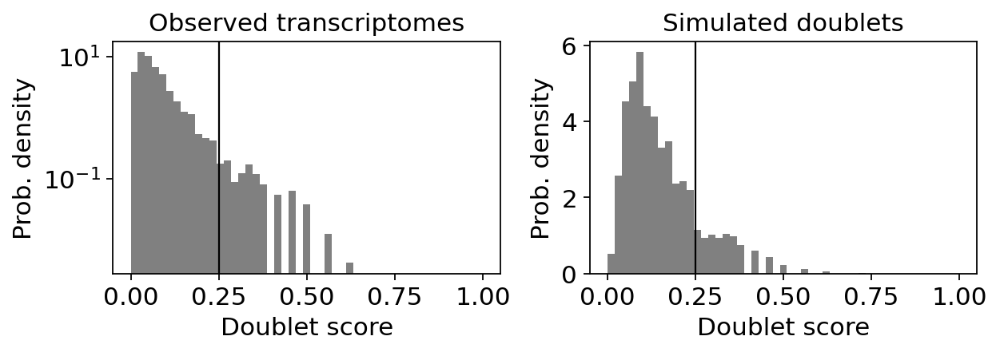

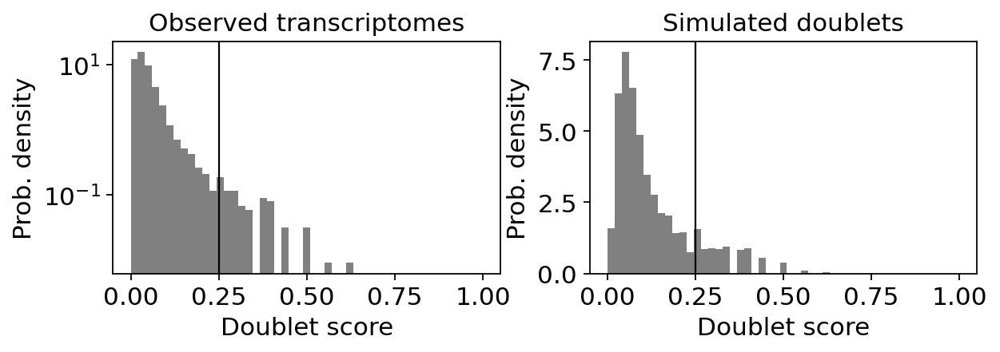

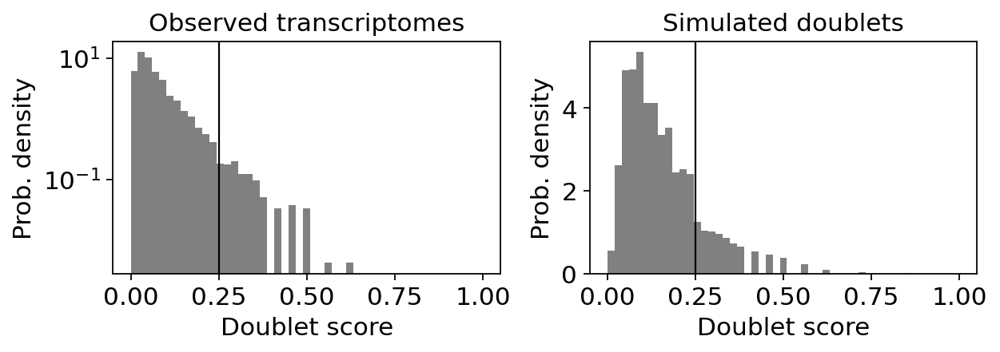

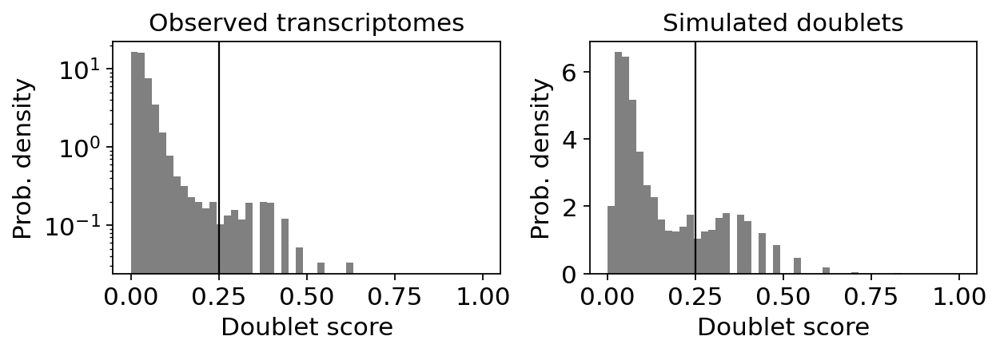

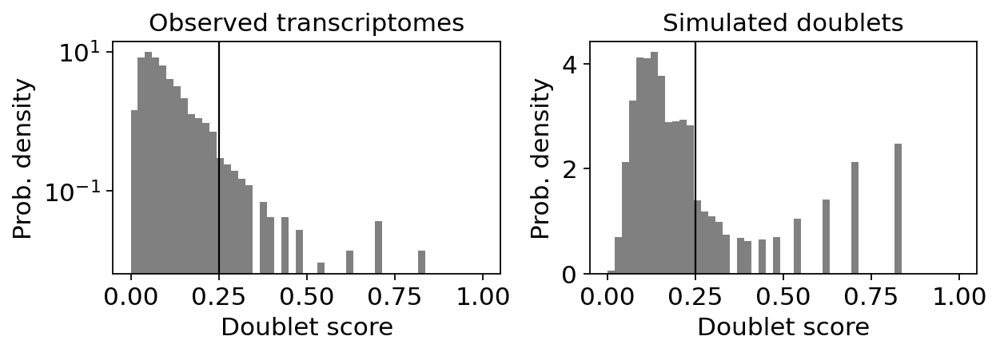

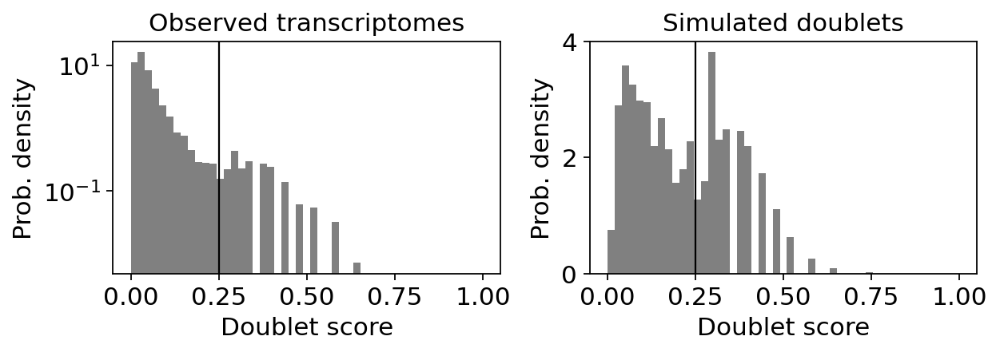

In [22]:
doublet_threshold = 0.25

scrubletPredictions = pd.DataFrame()
for key in adata.obs.batch.unique():
    subsetData = adata[adata.obs.batch == key]
    counts_matrix = subsetData.layers["raw_counts"]
    scrub = scr.Scrublet(counts_matrix, expected_doublet_rate=0.06)
    doublet_scores, predicted_doublets = scrub.scrub_doublets(
        min_counts=2, 
        min_cells=3, 
        min_gene_variability_pctl=85, 
        n_prin_comps=30
    )
    scrub.call_doublets(threshold=doublet_threshold)
    scrub.plot_histogram()
    scrubletPrediction = pd.DataFrame({"scrublet_score": doublet_scores}, index=subsetData.obs.index)
    scrubletPredictions = pd.concat([scrubletPredictions, scrubletPrediction])
    
adata.obs["scrublet_score"] = scrubletPredictions.scrublet_score
adata.obs["scrublet_called_doublet"] = adata.obs.scrublet_score > doublet_threshold
num_doublets = adata.obs.scrublet_called_doublet.sum()
pct_doublets = round(num_doublets/len(adata)*100, 3)
print(f"{pct_doublets}% of cells classified as doublets ({num_doublets} cells)")

In [23]:
adata = adata[~adata.obs.scrublet_called_doublet].copy()

# Preprocessing

In [24]:
# Annotate mito genes
adata.var["mt"] = adata.var_names.str.startswith("mt-")
# Get qc metrics for each cell, gene
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True, percent_top=None, log1p=False,)
# Basic prefiltering of empty cells, 0 counts genes
sc.pp.filter_cells(adata, min_genes=1)
sc.pp.filter_genes(adata, min_cells=1)

## QC plotting

### Live view

In [25]:
# Inputs for live QC plotting
obs_key="batch" # Key in obs to color data by (if all data is one batch, create an obs column with the same label for all cells
plot_adata=adata

In [26]:
# Colors for each batch
colors=[
        '#1f77b4',  # muted blue
        '#ff7f0e',  # safety orange
        '#2ca02c',  # cooked asparagus green
        '#d62728',  # brick red
        '#9467bd',  # muted purple
        '#8c564b',  # chestnut brown
        '#e377c2',  # raspberry yogurt pink
        '#7f7f7f',  # middle gray
        '#bcbd22',  # curry yellow-green
        '#17becf'   # blue-teal
    ]
# Slider widgets
mt_thresh_slider = widgets.IntSlider(
    value=10,
    min=0,
    max=100,
    step=1.0,
    description='pct_mt:',
    continuous_update=False,
    layout=widgets.Layout(width='750px'),
    style={'description_width': '125px'},
)
total_counts_thresh_slider = widgets.IntSlider(
    value=30000,
    min=0,
    max=adata.obs.total_counts.max(),
    step=250,
    description='total_counts:',
    continuous_update=False,
    layout=widgets.Layout(width='750px'),
    style={'description_width': '125px'},
)
num_genes_thresh_slider = widgets.IntSlider(
    value=7500,
    min=0,
    max=adata.obs.n_genes_by_counts.max(),
    step=100,
    description='n_genes_by_counts:',
    continuous_update=False,
    layout=widgets.Layout(width='750px'),
    style={'description_width': '125px'},
)
# Slider controls widgets
show_thresh_check = widgets.Checkbox(
    description='Show thresholds',
    value=True,
)
reset_button = widgets.Button(
    description="Reset",
    disabled=False,
    tooltip="Reset thresholds",
)


# pct_mt threshold plot
traces = []
for i,category in enumerate(plot_adata.obs[obs_key].unique()):
    subset_adata = plot_adata[plot_adata.obs[obs_key] == category]
    traces.append(
        go.Histogram(
            x=subset_adata.obs.pct_counts_mt,
            marker=dict(
                color=colors[i],
            ),
            name=category,
            legendgroup=category,
        ),
    )
# Setup the layout for the plot and add data
g1 = go.FigureWidget(
    data=traces,
    layout=go.Layout(
        barmode="group",
        plot_bgcolor="rgba(255,255,255,255)",
        width=400,
        height=400,
        xaxis=dict(
            linecolor="black",
            title="pct_counts_mt",
            title_standoff=1,
        ),
        yaxis=dict(
            linecolor="black",
        ),
    )
)
# Add threshold lines
g1.add_vline(
    name="pct_mt",
    x=mt_thresh_slider.value,
    line_dash="dash",
)

# total_counts by num_genes threshold plot
traces = []
for i,category in enumerate(plot_adata.obs[obs_key].unique()):
    subset_adata = plot_adata[plot_adata.obs[obs_key] == category]
    traces.append(
        go.Scatter(
            x=subset_adata.obs.total_counts,
            y=subset_adata.obs.n_genes_by_counts,
            mode="markers",
            marker=dict(
                color=colors[i],
                size=2,
            ),
            name=category,
            legendgroup=category,
        ),
    )
# Setup the layout for the plot and add data
g2 = go.FigureWidget(
    data=traces,
    layout=go.Layout(
        barmode="group",
        plot_bgcolor="rgba(255,255,255,255)",
        width=400,
        height=400,
        xaxis=dict(
            linecolor="black",
            title="total_counts",
            title_standoff=1,
        ),
        yaxis=dict(
            linecolor="black",
            title="n_genes_by_counts",
            title_standoff=1,
        ),
        legend= {'itemsizing': 'constant'},
    )
)
# Add threshold lines
g2.add_vline(
    name="total_counts",
    x=total_counts_thresh_slider.value,
    line_dash="dash",
)
g2.add_hline(
    name="num_genes",
    y=num_genes_thresh_slider.value,
    line_dash="dash",
)

# total_counts by rank (elbow) threshold plot
traces = []
for i,category in enumerate(plot_adata.obs[obs_key].unique()):
    category_data = plot_adata[plot_adata.obs.batch == category].obs.copy()
    category_data["rank"] = category_data.total_counts.rank(method="first", ascending=False,)
    category_data = category_data.sort_values(by="rank")
    traces.append(
        go.Scatter(
            x=category_data["rank"],
            y=category_data.total_counts,
            marker=dict(
                color=colors[i],
            ),
            name=category,
            legendgroup=category,
        ),
    )
# Setup the layout for the plot and add data
g3 = go.FigureWidget(
    data=traces,
    layout=go.Layout(
        barmode="group",
        plot_bgcolor="rgba(255,255,255,255)",
        width=400,
        height=400,
        xaxis=dict(
            linecolor="black",
            title="rank",
            title_standoff=1,
        ),
        yaxis=dict(
            linecolor="black",
            title="total_counts",
            title_standoff=1,
        ),
    )
)
# Add threshold lines
g3.add_hline(
    name="total_counts",
    y=total_counts_thresh_slider.value,
    line_dash="dash",
)
g3.update_layout(yaxis_type = "log")

# Callback method that update the plot threshold lines
def update(change):
    with g1.batch_update():
        for shape in g1["layout"]["shapes"]:
            if shape.name == "pct_mt":
                shape.x0=mt_thresh_slider.value
                shape.x1=mt_thresh_slider.value
            if show_thresh_check.value == True:
                g1.update_shapes(visible=True)
            else:
                g1.update_shapes(visible=False)
    with g2.batch_update():
        for shape in g2["layout"]["shapes"]:
            if shape.name == "total_counts":
                shape.x0=total_counts_thresh_slider.value
                shape.x1=total_counts_thresh_slider.value
            if shape.name == "num_genes":
                    shape.y0=num_genes_thresh_slider.value
                    shape.y1=num_genes_thresh_slider.value
        if show_thresh_check.value == True:
            g2.update_shapes(visible=True)
        else:
            g2.update_shapes(visible=False)
    with g3.batch_update():
        for shape in g3["layout"]["shapes"]:
            if shape.name == "total_counts":
                shape.y0=total_counts_thresh_slider.value
                shape.y1=total_counts_thresh_slider.value
        if show_thresh_check.value == True:
            g3.update_shapes(visible=True)
        else:
            g3.update_shapes(visible=False)
# Callback method that resets the thresholds to defaults
def reset(change):
    total_counts_thresh_slider.value = 30000
    num_genes_thresh_slider.value = 7500
    mt_thresh_slider.value = 10
    update()

# Callback triggers for each widget
mt_thresh_slider.observe(update, names="value")
total_counts_thresh_slider.observe(update, names="value")
num_genes_thresh_slider.observe(update, names="value")
show_thresh_check.observe(update, names="value")
reset_button.on_click(reset)

# layout the plots/widgets
sliders = widgets.VBox(
    children=[mt_thresh_slider, total_counts_thresh_slider, num_genes_thresh_slider],
    layout=widgets.Layout(
        width="1050px",
        display="flex",
        flex_flow="column",
        align_items='center',
    )
)
slider_controls = widgets.HBox(
    children=[reset_button, show_thresh_check],
    layout=widgets.Layout(
        width="1200px",
        display="flex",
        flex_flow="row",
        justify_content='center',
    )
)
plots = widgets.HBox(
    children=[g1,g2,g3],
)

# display the plot/widgets
widgets.VBox(
    [sliders, slider_controls, plots],
)

### QC filter

In [27]:
# Helper method for plotting QC metrics for scrnaseq package
def qc_plot(adata, counts_thresh=30000, genes_thresh=5000, mt_thresh=10, show_thresh=True, batch_key="batch"):
    sns.set_style("ticks")
    sns.set_context("paper")
    fig=plt.figure(figsize=(9,3))
    plt.subplot(1,3,1)
    sns.histplot(
        x=adata.obs.pct_counts_mt,
        hue=adata.obs[batch_key],
    )
    if show_thresh:
        plt.axvline(
            x=mt_thresh,
            ymin=0,
            ymax=1,
            color="black",
            linestyle="--",
        )

    plt.subplot(1,3,2)
    sns.scatterplot(
        x=adata.obs.total_counts,
        y=adata.obs.n_genes_by_counts,
        s=2,
        hue=adata.obs[batch_key],
        linewidth=0,
    )
    if show_thresh:
        plt.axvline(
            x=counts_thresh,
            ymin=0,
            ymax=1,
            color="black",
            linestyle="--",
        )
        plt.axhline(
            y=genes_thresh,
            xmin=0,
            xmax=1,
            color="black",
            linestyle="--",
        )
    plt.subplot(1,3,3)
    cell_data = pd.DataFrame()
    for category in adata.obs[batch_key].unique():
        category_data = adata[adata.obs[batch_key] == category].obs.copy()
        category_data["rank"] = category_data.total_counts.rank(method="first", ascending=False,)
        cell_data = pd.concat([cell_data, category_data])
    cell_data = cell_data.sort_values(by="rank")
    ax = sns.lineplot(
        x=cell_data["rank"],
        y=cell_data.total_counts,
        hue=cell_data[batch_key],
        hue_order=adata.obs[batch_key].unique(),
    )
    ax.set(yscale="log")
    if show_thresh:
        plt.axhline(
            y=counts_thresh,
            xmin=0,
            xmax=1,
            color="black",
            linestyle="--",
        )
    fig.tight_layout()
    plt.show()

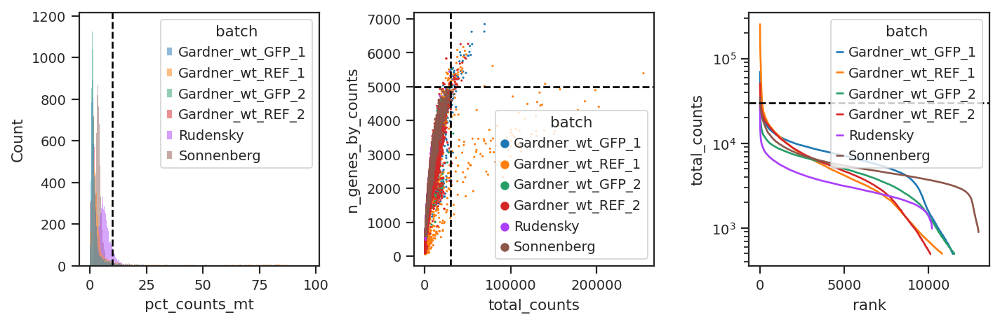

In [28]:
# Set thresholds
totalCountsThreshold = 30000
numGenesThreshold = 5000
mtThreshold = 10

# Check QC thresholds before filtering
qc_plot(adata, totalCountsThreshold, numGenesThreshold, mtThreshold)

In [29]:
# Filter cells based on thresholds
adataFiltered = adata[adata.obs.pct_counts_mt <= mtThreshold].copy()
adataFiltered = adataFiltered[adataFiltered.obs.total_counts <= totalCountsThreshold]
adataFiltered = adataFiltered[adataFiltered.obs.total_counts >= 3000]
adataFiltered = adataFiltered[adataFiltered.obs.n_genes_by_counts <= numGenesThreshold]
adataFiltered = adataFiltered[adataFiltered.obs.n_genes_by_counts >= 1250]

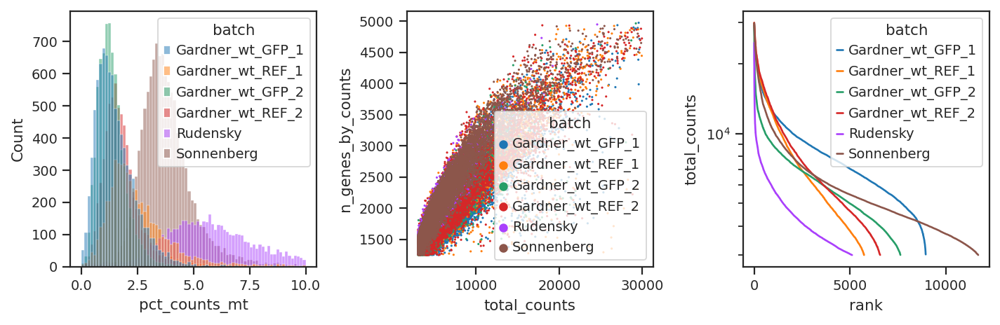

In [30]:
qc_plot(adataFiltered, show_thresh=False)

In [31]:
# overwrite original adata variable with the filtered data
adata = adataFiltered.copy()

# Clean up to save memory 
del adataFiltered

In [32]:
adata.obs.batch.value_counts()

Sonnenberg          11684
Gardner_wt_GFP_1     8947
Gardner_wt_GFP_2     7626
Gardner_wt_REF_2     6570
Gardner_wt_REF_1     5733
Rudensky             5106
Name: batch, dtype: int64

## Normalize data (scanpy)

In [33]:
# Scanpy preprocessing pipeline
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata # Preserve log-transformed counts in the raw attribute

## Subset genes

In [34]:
#adata = adata[:, adata.var.mean_counts > 0.01]

## Regress covariates and scale

In [35]:
# Finish scanpy preprocessing pipeline
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)

# scVI training

In [50]:
# Setup scVI model using raw counts and batch info
scvi.model.SCVI.setup_anndata(
    adata,
    layer="raw_counts",
    batch_key="source",
)
model = scvi.model.SCVI(adata)

In [51]:
# Train scVI model
model.train()

/opt/conda/lib/python3.8/site-packages/scvi/model/base/_training_mixin.py:67: UserWarning:

max_epochs=175 is less than n_epochs_kl_warmup=400. The max_kl_weight will not be reached during training.

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 175/175: 100%|██████████| 175/175 [44:20<00:00, 15.18s/it, loss=5.83e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=175` reached.


Epoch 175/175: 100%|██████████| 175/175 [44:20<00:00, 15.20s/it, loss=5.83e+03, v_num=1]


In [52]:
# Check save paths
if not os.path.isdir("/notebook/External/Archive/Joe/processed_data/TSA_scoring/scVI_models"):
    os.makedirs("/notebook/External/Archive/Joe/processed_data/TSA_scoring/scVI_models")
    
if not os.path.isdir("/notebook/External/Archive/Joe/processed_data/TSA_scoring/h5ad_files"):
    os.makedirs("/notebook/External/Archive/Joe/processed_data/TSA_scoring/h5ad_files")
    
if os.path.isdir("/notebook/External/Archive/Joe/processed_data/TSA_scoring/scVI_models/WT_LN_merged_atlas_all_genes"):
    shutil.rmtree("/notebook/External/Archive/Joe/processed_data/TSA_scoring/scVI_models/WT_LN_merged_atlas_all_genes")
    
# save the scVI model and adata object before further processing because training is non-deterministic
model.save("/notebook/External/Archive/Joe/processed_data/TSA_scoring/scVI_models/WT_LN_merged_atlas_all_genes")
adata.write("/notebook/External/Archive/Joe/processed_data/TSA_scoring/h5ad_files/WT_LN_merged_atlas_all_genes.h5ad")

In [53]:
adata = sc.read("/notebook/External/Archive/Joe/processed_data/TSA_scoring/h5ad_files/WT_LN_merged_atlas_all_genes.h5ad")
model = scvi.model.SCVI.load("/notebook/External/Archive/Joe/processed_data/TSA_scoring/scVI_models/WT_LN_merged_atlas_all_genes", adata=adata)

INFO     File /notebook/External/Archive/Joe/processed_data/TSA_scoring/scVI_models/WT_LN_mer
         ged_atlas_all_genes/model.pt already downloaded                                     


In [54]:
# get scVI latent space and normalized expression
adata.obsm["X_scVI"] = model.get_latent_representation()
adata.layers["scVI_normalized"] = model.get_normalized_expression(library_size=1e4)

# Dimensionality reduction

In [55]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.tsne(adata, use_rep="X_scVI")

/opt/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/opt/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/opt/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



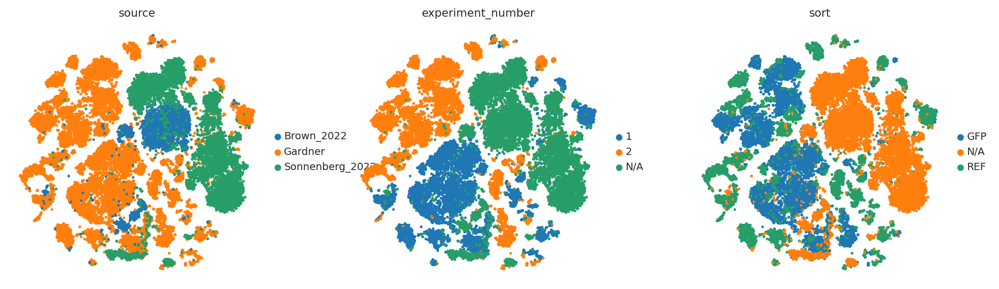

In [56]:
# Check dimensionality reduction for batch effects
sc.pl.tsne(
    adata,
    color=["source", "experiment_number", "sort"],
    s=20,
)

# Clustering

In [57]:
sc.tl.leiden(adata, key_added="leiden_scVI", resolution=1)

/opt/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



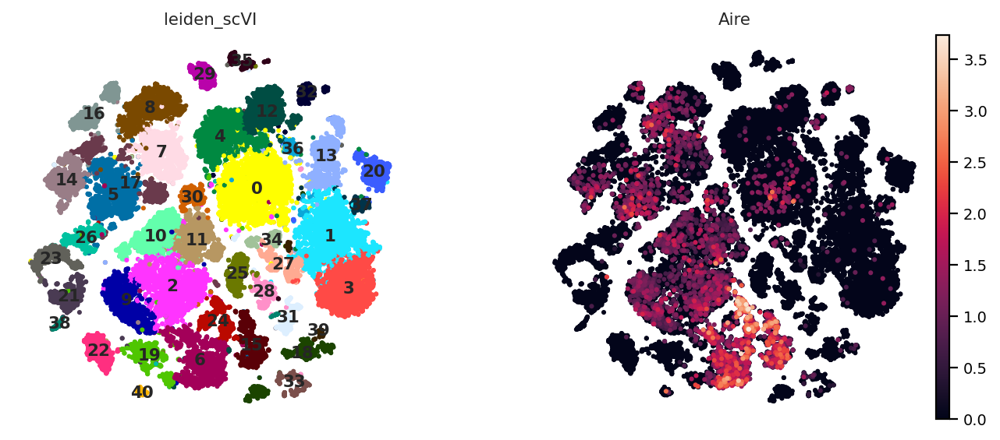

In [58]:
sc.pl.tsne(
    adata,
    color=["leiden_scVI", "Aire"],
    legend_loc="on data",
    s=30
)

/opt/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



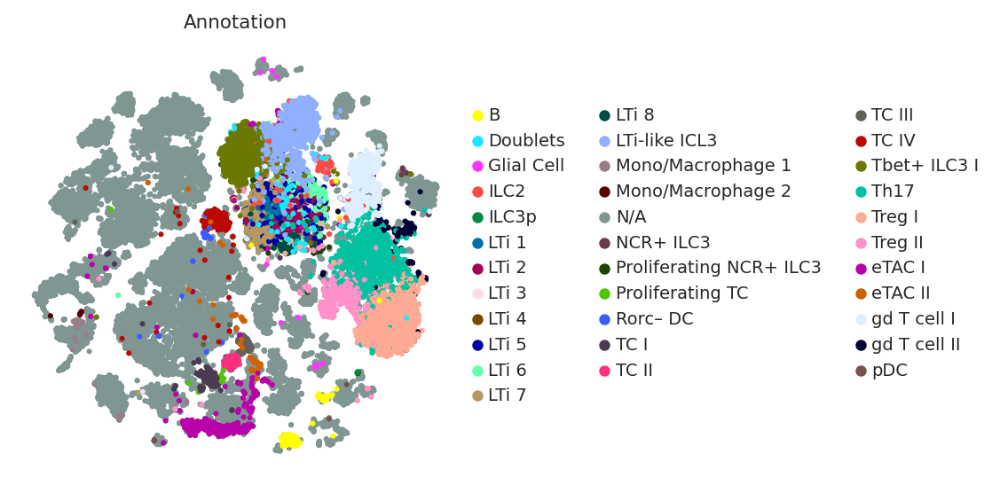

In [59]:
sc.pl.tsne(
    adata,
    color=["Annotation"],
    s=30
)

# Cell type assignment

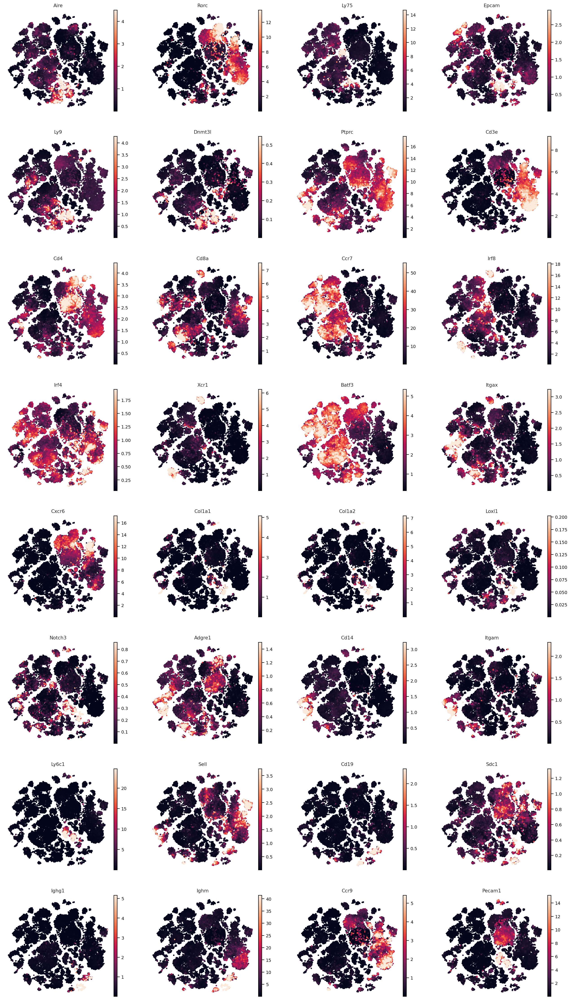

In [60]:
# Rename leiden clusters with corresponding cell types
cellTypes = {

}

adata.obs["cell_type"] = adata.obs.leiden_scVI.replace(cellTypes)

# Plot key marker genes
rna.pl.gene_tsne(
    adata,
    gene_list=[ 
           "Aire", "Rorc", "Ly75", "Epcam", "Ly9", "Dnmt3l", #JCs
           "Ptprc", #Lymphocytes
           "Cd3e", "Cd4", "Cd8a", #T cells
           "Ccr7", "Irf8", "Irf4", "Xcr1", "Batf3", "Itgax", #DCs
           "Cxcr6", #ILC3
           "Col1a1", "Col1a2", "Loxl1", "Notch3", #Fibro
           "Adgre1", "Cd14", "Itgam", "Ly6c1", "Sell", #Macs/Mo
           "Cd19", "Sdc1", "Ighg1", "Ighm", #B/Plasma cells
           #GN
           "Ccr9", #pDC
           "Pecam1", #LEC
    ],
    legend_loc="on data",
    layer="scVI_normalized",
    legend_fontsize="xx-small",
    s=30,
)

/opt/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/opt/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



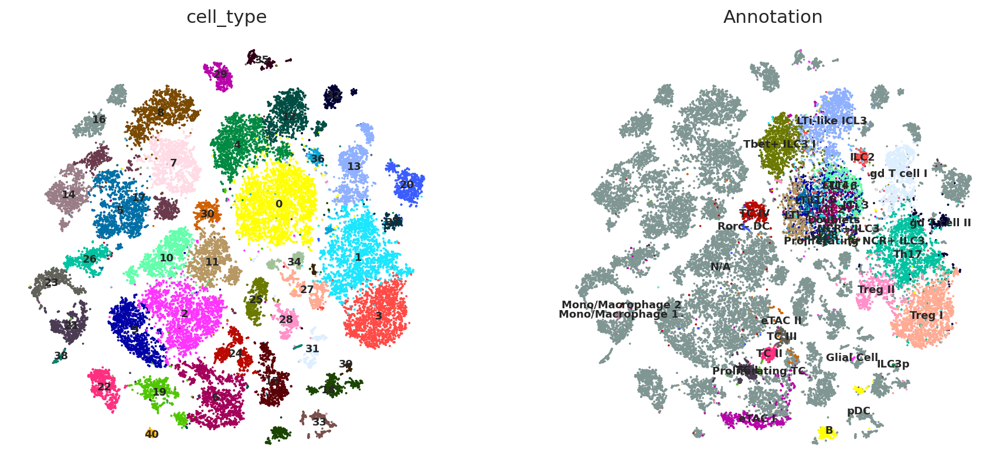

In [61]:
sc.set_figure_params(figsize=(6,6),  dpi=80, dpi_save=300, facecolor="white", frameon=False)
sc.pl.tsne(
    adata,
    color=["cell_type", "Annotation"],
    legend_loc="on data",
    legend_fontsize="xx-small",
    s=10,
)

# Subset on JCs

In [ ]:
adataSubset = adata[adata.obs.leiden_scVI.isin(["23", "16", "6", "9"])].copy()

In [ ]:
sc.pp.neighbors(adataSubset, use_rep="X_scVI")
sc.tl.umap(adataSubset, min_dist=0.3)#, use_rep="X_scVI")

In [ ]:
# Check dimensionality reduction for batch effects
sc.pl.umap(
    adataSubset,
    color=["dataset", "experiment_number", "sort"],
    s=30,
)

In [ ]:
sc.tl.leiden(adataSubset, key_added="leiden_scVI", resolution=0.6)

In [ ]:
sc.set_figure_params(figsize=(6,6),  dpi=80, dpi_save=300, facecolor="white", frameon=False)
sc.pl.umap(
    adataSubset,
    color=["leiden_scVI", "cell_type", "Annotation"],
    legend_loc="on data",
    legend_fontsize="xx-small",
    s=30,
)

In [ ]:
# Rename leiden clusters with corresponding cell types
cellTypes = {

}

adataSubset.obs["cell_type_fine"] = adataSubset.obs.leiden_scVI.replace(cellTypes)

# Plot key marker genes
rna.pl.gene_umap(
    adataSubset,
    gene_list=[ 
           "Aire", "Rorc", "Ly75", "Epcam", "Ly9", "Dnmt3l", #JCs
           "Ptprc", #Lymphocytes
           "Cd3e", "Cd4", "Cd8a", #T cells
           "Ccr7", "Irf8", "Irf4", "Xcr1", "Batf3", "Itgax", #DCs
           "Cxcr6", #ILC3
           "Col1a1", "Col1a2", "Loxl1", #Fibro
           "Adgre1", "Cd14", "Itgam", "Ly6c1", "Sell", #Macs/Mo
           "Cd19", "Sdc1", "Ighg1", "Ighm", #B/Plasma cells
           #GN
           "Ccr9", #pDC
           "Pecam1", #LEC
          ],
    legend_loc="on data",
    layer="scVI_normalized",
    legend_fontsize="xx-small",
    s=30,
)

In [ ]:
sc.set_figure_params(figsize=(6,6),  dpi=80, dpi_save=300, facecolor="white", frameon=False)
sc.pl.umap(
    adataSubset,
    color=["dataset", "cell_type", "cell_type_fine", "Annotation"],
    legend_loc="on data",
    legend_fontsize="xx-small",
    s=30
)

In [ ]:
rna.pl.gene_umap(
    adataSubset,
    gene_list=[ 
           "Aire", "Rorc", "Ly75", "Epcam", "Ly9", "Dnmt3l", #JCs
          ],
    legend_loc="on data",
    layer="scVI_normalized",
    legend_fontsize="xx-small",
    s=30,
)

# Save anndata

In [ ]:
adata.write("/notebook/External/Archive/Joe/processed_data/TSA_scoring/h5ad_files/WT_LN_merged_atlas_all_genes.h5ad")

In [ ]:
adataSubset.write("/notebook/External/Archive/Joe/processed_data/TSA_scoring/h5ad_files/WT_LN_merged_atlas_JC_subset_all_genes.h5ad")

## Immgen similarity scoring

In [ ]:
immgen=pd.read_csv('/notebook/External/Archive/Joe/raw_data/immgen/Immgen_expression.txt', sep='\t',index_col=0)
probes=pd.read_csv('/notebook/External/Archive/Joe/raw_data/immgen/Immgen_probes.txt', sep='\t',index_col=0,header=None)
g2n=pd.read_csv('/notebook/External/Archive/Joe/raw_data/immgen/mart_export.txt', sep='\t',)
probes=probes.join(g2n.set_index('Gene stable ID')['Gene name'], on=1)
probes.columns=['gene_id', 'gene_name']
immgen = immgen.join(probes['gene_name']).set_index('gene_name')
immgen = immgen.groupby(immgen.index).aggregate('sum')

In [ ]:
similarityAdata = rna.tl.cell_type_similarity(adata, signatures=immgen)

In [ ]:
similarityScores = [i for i in similarityAdata.obs.columns if "cosine_similarity_cell_z_score" in i]

In [ ]:
len(similarityScores)

In [ ]:
sc.set_figure_params(figsize=(4,4),  dpi=70, dpi_save=300, facecolor="white", frameon=False, fontsize=8)
sc.pl.tsne(
    similarityAdata,
    color=similarityScores[0:100],
    cmap="coolwarm",
    s=30,
)
sc.pl.tsne(
    similarityAdata,
    color=similarityScores[100:],
    cmap="coolwarm",
    s=30,
)
sc.set_figure_params(figsize=(4,4),  dpi=80, dpi_save=300, facecolor="white", frameon=False)